# Project Goals



This task is based on a synthesised transaction dataset containing 3 months’ worth of transactions for 100 hypothetical customers. It contains purchases, recurring transactions, and salary transactions.

Some of the questions attempted to answer include:

• What is the average transaction amount? 
• How many transactions do customers make each month, on average?
• What is the overall transaction volume/purchase transaction volume over the course of an average day/week.
• Transaction volume and amount by Age and Gender
• Transaction volume and amount by state

### Package and Dataset Import


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option("display.max_columns", None)

In [2]:
df=pd.read_excel("ANZ Dataset.xlsx")


### Basic  Exploration

In [3]:
#Number of rows and columns
print("Number of rows and columns", df.shape)

Number of rows and columns (12043, 23)


In [4]:
df.size

276989

In [5]:
#Check the columns
pd.DataFrame({"Column":df.columns})

,Column
0,status
1,card_present_flag
2,bpay_biller_code
3,account
4,currency
5,long_lat
6,txn_description
7,merchant_id
8,merchant_code
9,first_name


In [6]:
#Details of columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12043 entries, 0 to 12042
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   status             12043 non-null  object        
 1   card_present_flag  7717 non-null   float64       
 2   bpay_biller_code   885 non-null    object        
 3   account            12043 non-null  object        
 4   currency           12043 non-null  object        
 5   long_lat           12043 non-null  object        
 6   txn_description    12043 non-null  object        
 7   merchant_id        7717 non-null   object        
 8   merchant_code      883 non-null    float64       
 9   first_name         12043 non-null  object        
 10  balance            12043 non-null  float64       
 11  date               12043 non-null  datetime64[ns]
 12  gender             12043 non-null  object        
 13  age                12043 non-null  int64         
 14  mercha

In [7]:
#Display first 5 rows
df.head()

,status,card_present_flag,bpay_biller_code,account,currency,long_lat,txn_description,merchant_id,merchant_code,first_name,balance,date,gender,age,merchant_suburb,merchant_state,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement
0,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,POS,81c48296-73be-44a7-befa-d053f48ce7cd,NaN,Diana,35.39,2018-08-01,F,26,Ashmore,QLD,2018-08-01T01:01:15.000+0000,16.25,a623070bfead4541a6b0fff8a09e706c,Australia,CUS-2487424745,153.38 -27.99,debit
1,authorized,0.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,830a451c-316e-4a6a-bf25-e37caedca49e,NaN,Diana,21.20,2018-08-01,F,26,Sydney,NSW,2018-08-01T01:13:45.000+0000,14.19,13270a2a902145da9db4c951e04b51b9,Australia,CUS-2487424745,151.21 -33.87,debit
2,authorized,1.0,NaN,ACC-1222300524,AUD,151.23 -33.94,POS,835c231d-8cdf-4e96-859d-e9d571760cf0,NaN,Michael,5.71,2018-08-01,M,38,Sydney,NSW,2018-08-01T01:26:15.000+0000,6.42,feb79e7ecd7048a5a36ec889d1a94270,Australia,CUS-2142601169,151.21 -33.87,debit
3,authorized,1.0,NaN,ACC-1037050564,AUD,153.10 -27.66,SALES-POS,48514682-c78a-4a88-b0da-2d6302e64673,NaN,Rhonda,2117.22,2018-08-01,F,40,Buderim,QLD,2018-08-01T01:38:45.000+0000,40.90,2698170da3704fd981b15e64a006079e,Australia,CUS-1614226872,153.05 -26.68,debit
4,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,b4e02c10-0852-4273-b8fd-7b3395e32eb0,NaN,Diana,17.95,2018-08-01,F,26,Mermaid Beach,QLD,2018-08-01T01:51:15.000+0000,3.25,329adf79878c4cf0aeb4188b4691c266,Australia,CUS-2487424745,153.44 -28.06,debit


In [8]:
#Checking for any duplicate transactions
df.transaction_id.duplicated().sum()

0

In [9]:
#Confirming number of unique customers
df.account.nunique()

100

In [10]:
#Checking values for status column
df.status.value_counts(dropna=False)

authorized    7717
posted        4326
Name: status, dtype: int64

In [11]:
#Checking values for status column
df.card_present_flag.value_counts(dropna=False)

1.0    6194
NaN    4326
0.0    1523
Name: card_present_flag, dtype: int64

In [12]:
#Checking values for currency column
df.currency.value_counts(dropna=False)

AUD    12043
Name: currency, dtype: int64

In [13]:
#Checking values for txn_description column
df.txn_description.value_counts(dropna=False)

SALES-POS     3934
POS           3783
PAYMENT       2600
PAY/SALARY     883
INTER BANK     742
PHONE BANK     101
Name: txn_description, dtype: int64

In [14]:
#Checking values for Country column
df.country.value_counts(dropna=False)

Australia    12043
Name: country, dtype: int64

In [15]:
#Checking values for movement column
df.movement.value_counts(dropna=False)

debit     11160
credit      883
Name: movement, dtype: int64

In [16]:
#Confirming credit corresponds to salary payments - Ignore entries with txn_description 'PAY/SALARY' and check the value_counts 
df[-(df.txn_description=='PAY/SALARY')].movement.value_counts(dropna=False)

debit    11160
Name: movement, dtype: int64

In [17]:
#Checking for first and last transaction dates available in the dataset
df.date.describe(datetime_is_numeric=True)

count                            12043
mean     2018-09-15 21:27:39.951839232
min                2018-08-01 00:00:00
25%                2018-08-24 00:00:00
50%                2018-09-16 00:00:00
75%                2018-10-09 00:00:00
max                2018-10-31 00:00:00
Name: date, dtype: object

In [18]:
#Checking if transactions are missing for any dates in the 3-month period
pd.date_range(start = '2018-08-01', end = '2018-10-31').difference(df.date)

DatetimeIndex(['2018-08-16'], dtype='datetime64[ns]', freq=None)

In [19]:
#Checking for null values
df.isnull().sum().sort_values(ascending=False)

merchant_code        11160
bpay_biller_code     11158
merchant_suburb       4326
merchant_long_lat     4326
merchant_id           4326
card_present_flag     4326
merchant_state        4326
status                   0
customer_id              0
country                  0
transaction_id           0
amount                   0
extraction               0
date                     0
age                      0
gender                   0
balance                  0
first_name               0
txn_description          0
long_lat                 0
currency                 0
account                  0
movement                 0
dtype: int64

In [20]:
#Basic statistics of numerical columns
df.describe()

,card_present_flag,merchant_code,balance,age,amount
count,7717.000000,883.0,12043.000000,12043.000000,12043.000000
mean,0.802644,0.0,14704.195553,30.582330,187.933588
std,0.398029,0.0,31503.722652,10.046343,592.599934
min,0.000000,0.0,0.240000,18.000000,0.100000
25%,1.000000,0.0,3158.585000,22.000000,16.000000
50%,1.000000,0.0,6432.010000,28.000000,29.000000
75%,1.000000,0.0,12465.945000,38.000000,53.655000
max,1.000000,0.0,267128.520000,78.000000,8835.980000


##### Insights from basic data exploration

1. There are 12043 transaction records with 0 duplicates
2. Data available for 100 unique customers
3. Status is either authorised (transaction approved) or Posted (pending approval) 
4. Card present flag has 6194 entries of 1 (card present at transaction),
   1523 of 0 entries(card not present) and 4326 missing values 
5. All transactions in Australia and currency in AUD, hence columns can be dropped
5. bpay_biller_code and merchant_code columns have 90% of data missing, hence can be dropped 
6. Merchant_id, merchant_suburb, merchant_state and merchant_long-lat have exactly 4326 rows of missing data, indicating
   missing merchant details, so the merchant details can be updated as n/a
7. Types of transactions - SALES-POS, POS, PAYMENT, PAY/SALARY, INTER BANK, PHONE BANK. 
8. Age of customers range from 18 to 78.

### Data Cleaning

In [21]:
#Drop irrelevant and missing columns
df.drop(columns=['currency','country','bpay_biller_code','merchant_code'], inplace=True)

In [22]:
#Confirming columns dropped 
pd.DataFrame({"Column": df.columns})

,Column
0,status
1,card_present_flag
2,account
3,long_lat
4,txn_description
5,merchant_id
6,first_name
7,balance
8,date
9,gender


In [23]:
#Replace blanks in card_present_flag and merchant details with n/a
df.card_present_flag=np.where(df.card_present_flag.isnull(),'n/a',df.card_present_flag)
df.merchant_id=np.where(df.merchant_id.isnull(),'n/a',df.merchant_id)
df.merchant_suburb=np.where(df.merchant_suburb.isnull(),'n/a',df.merchant_suburb)
df.merchant_state=np.where(df.merchant_state.isnull(),'n/a',df.merchant_state)
df.merchant_long_lat=np.where(df.merchant_long_lat.isnull(),'n/a',df.merchant_long_lat)

In [24]:
df.isnull().sum()

status               0
card_present_flag    0
account              0
long_lat             0
txn_description      0
merchant_id          0
first_name           0
balance              0
date                 0
gender               0
age                  0
merchant_suburb      0
merchant_state       0
extraction           0
amount               0
transaction_id       0
customer_id          0
merchant_long_lat    0
movement             0
dtype: int64

In [25]:
#Split the date column into Month and day of week
df['month']=df.date.dt.month
df['day_of_week']=df.date.dt.dayofweek

In [26]:
df['hour']= [t.split('T')[1].split('.')[0].split(':')[0] for t in df.extraction]
df.hour=pd.to_numeric(df.hour)

In [27]:
df['txn_description'] = df['txn_description'].str.replace('SALES-POS', 'POS')
df['txn_description'] = df['txn_description'].str.replace('PHONE BANK', 'OTHER')
df['txn_description'] = df['txn_description'].str.replace('INTER BANK', 'OTHER')
df['txn_description'] = df['txn_description'].str.replace('PAYMENT', 'OTHER')

In [28]:
df.head()

,status,card_present_flag,account,long_lat,txn_description,merchant_id,first_name,balance,date,gender,age,merchant_suburb,merchant_state,extraction,amount,transaction_id,customer_id,merchant_long_lat,movement,month,day_of_week,hour
0,authorized,1.0,ACC-1598451071,153.41 -27.95,POS,81c48296-73be-44a7-befa-d053f48ce7cd,Diana,35.39,2018-08-01,F,26,Ashmore,QLD,2018-08-01T01:01:15.000+0000,16.25,a623070bfead4541a6b0fff8a09e706c,CUS-2487424745,153.38 -27.99,debit,8,2,1
1,authorized,0.0,ACC-1598451071,153.41 -27.95,POS,830a451c-316e-4a6a-bf25-e37caedca49e,Diana,21.20,2018-08-01,F,26,Sydney,NSW,2018-08-01T01:13:45.000+0000,14.19,13270a2a902145da9db4c951e04b51b9,CUS-2487424745,151.21 -33.87,debit,8,2,1
2,authorized,1.0,ACC-1222300524,151.23 -33.94,POS,835c231d-8cdf-4e96-859d-e9d571760cf0,Michael,5.71,2018-08-01,M,38,Sydney,NSW,2018-08-01T01:26:15.000+0000,6.42,feb79e7ecd7048a5a36ec889d1a94270,CUS-2142601169,151.21 -33.87,debit,8,2,1
3,authorized,1.0,ACC-1037050564,153.10 -27.66,POS,48514682-c78a-4a88-b0da-2d6302e64673,Rhonda,2117.22,2018-08-01,F,40,Buderim,QLD,2018-08-01T01:38:45.000+0000,40.90,2698170da3704fd981b15e64a006079e,CUS-1614226872,153.05 -26.68,debit,8,2,1
4,authorized,1.0,ACC-1598451071,153.41 -27.95,POS,b4e02c10-0852-4273-b8fd-7b3395e32eb0,Diana,17.95,2018-08-01,F,26,Mermaid Beach,QLD,2018-08-01T01:51:15.000+0000,3.25,329adf79878c4cf0aeb4188b4691c266,CUS-2487424745,153.44 -28.06,debit,8,2,1


In [29]:
df.describe()

,balance,age,amount,month,day_of_week,hour
count,12043.000000,12043.000000,12043.000000,12043.000000,12043.000000,12043.000000
mean,14704.195553,30.582330,187.933588,9.011957,3.085029,13.268621
std,31503.722652,10.046343,592.599934,0.816511,1.890169,5.777284
min,0.240000,18.000000,0.100000,8.000000,0.000000,0.000000
25%,3158.585000,22.000000,16.000000,8.000000,2.000000,9.000000
50%,6432.010000,28.000000,29.000000,9.000000,3.000000,13.000000
75%,12465.945000,38.000000,53.655000,10.000000,5.000000,18.000000
max,267128.520000,78.000000,8835.980000,10.000000,6.000000,23.000000


In [30]:
#Checking for any duplicate transactions
df[df.duplicated(subset=['account','amount','date','hour'], keep=False)]

,status,card_present_flag,account,long_lat,txn_description,merchant_id,first_name,balance,date,gender,age,merchant_suburb,merchant_state,extraction,amount,transaction_id,customer_id,merchant_long_lat,movement,month,day_of_week,hour
2011,posted,n/a,ACC-1683215619,138.67 -34.86,PAY/SALARY,n/a,Barry,2503.10,2018-08-17,M,38,n/a,n/a,2018-08-17T15:00:00.000+0000,2500.00,04919fcea7f94f67a0110b4fe9e566d2,CUS-1604596597,n/a,credit,8,4,15
2012,posted,n/a,ACC-1683215619,138.67 -34.86,PAY/SALARY,n/a,Barry,5003.10,2018-08-17,M,38,n/a,n/a,2018-08-17T15:00:00.000+0000,2500.00,c0d8288597cd4e42adfec1a5e161e68b,CUS-1604596597,n/a,credit,8,4,15
5754,posted,n/a,ACC-354106658,151.04 -33.80,PAY/SALARY,n/a,Christine,10891.05,2018-09-14,F,39,n/a,n/a,2018-09-14T15:00:00.000+0000,5103.51,188e04b6e00f44f3a43afbf232a6f5c3,CUS-2376382098,n/a,credit,9,4,15
5755,posted,n/a,ACC-354106658,151.04 -33.80,PAY/SALARY,n/a,Christine,15994.56,2018-09-14,F,39,n/a,n/a,2018-09-14T15:00:00.000+0000,5103.51,7faf986ac5a341e3adfdb7030ec03f48,CUS-2376382098,n/a,credit,9,4,15
6263,posted,n/a,ACC-1683215619,138.67 -34.86,PAY/SALARY,n/a,Barry,6380.41,2018-09-18,M,38,n/a,n/a,2018-09-18T15:00:00.000+0000,2500.00,4c76e959bda94646b2ebba276487aa18,CUS-1604596597,n/a,credit,9,1,15
6264,posted,n/a,ACC-1683215619,138.67 -34.86,PAY/SALARY,n/a,Barry,8880.41,2018-09-18,M,38,n/a,n/a,2018-09-18T15:00:00.000+0000,2500.00,2503b83e36074dfab25e0f1c5f4ed31c,CUS-1604596597,n/a,credit,9,1,15
8606,posted,n/a,ACC-2270192619,138.56 -35.27,PAY/SALARY,n/a,Darren,14448.78,2018-10-05,M,20,n/a,n/a,2018-10-05T17:00:00.000+0000,3026.95,812d58434d704041aa033b5ae904efe9,CUS-2110742437,n/a,credit,10,4,17
8607,posted,n/a,ACC-2270192619,138.56 -35.27,PAY/SALARY,n/a,Darren,17475.73,2018-10-05,M,20,n/a,n/a,2018-10-05T17:00:00.000+0000,3026.95,efbc0cb742af4879a122c99ae728354b,CUS-2110742437,n/a,credit,10,4,17
9902,posted,n/a,ACC-354106658,151.04 -33.80,PAY/SALARY,n/a,Christine,19032.03,2018-10-15,F,39,n/a,n/a,2018-10-15T15:00:00.000+0000,5103.51,dfff2531d8434969b7f385d364772534,CUS-2376382098,n/a,credit,10,0,15
9903,posted,n/a,ACC-354106658,151.04 -33.80,PAY/SALARY,n/a,Christine,24135.54,2018-10-15,F,39,n/a,n/a,2018-10-15T15:00:00.000+0000,5103.51,e4e7f0dd7c504c45990277dad7a8a86c,CUS-2376382098,n/a,credit,10,0,15


#### Salary payments seem to be duplicated for 7 records since the account number, amount, date and time of transaction are repeated and the type of transaction is salary.


In [31]:
#Removing the duplicates entries. Balance column will be affected by this deletion and hence cannot be used for further analysis

data=df[-(df.duplicated(subset=['account','amount','date','hour'], keep='first'))]
data.shape

(12036, 22)

## Exploratory Data Analysis

In [32]:
#Check average transaction amount
data.amount.mean()


185.58609587902941

In [33]:
#Function to display percentage values
def func(pct, allvals):
    absolute = int(np.round(pct/100.*np.sum(allvals)))
    return "{:.1f}%".format(pct, absolute)

def display_percent(ax):
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width()/2 
        y = p.get_height()+20
        ax.annotate(percentage, (x, y),ha='center')


## Transaction Type

In [34]:
data[['txn_description','amount']].groupby('txn_description',as_index=False).mean().sort_values(by='amount',ascending=False)

,txn_description,amount
1,PAY/SALARY,1880.144863
0,OTHER,80.406913
2,POS,40.153732


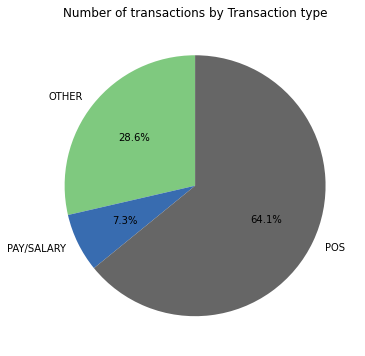

In [35]:
#Number of transactions by Transaction type
d=data.groupby(['txn_description'])['transaction_id'].count()
ax=d.plot(kind='pie', figsize =(12,6), colormap='Accent',legend=False, autopct=lambda pct: func(pct, d),startangle = 90)
ax.set(xlabel="", ylabel="", title="Number of transactions by Transaction type")
plt.show()

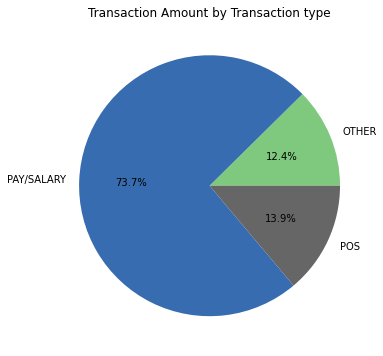

In [36]:
#Transaction amount by Transaction type
d=data.groupby(['txn_description'])['amount'].sum()
ax=d.plot(kind='pie', figsize =(12,6), colormap='Accent',legend=False, autopct=lambda pct: func(pct, d))
ax.set(xlabel="", ylabel="", title="Transaction Amount by Transaction type")
plt.show()

### Insights

While 64% of total number of transactions are POS transactions, Pay/Salary constitutes 73% of total amount of transactions  

## Gender

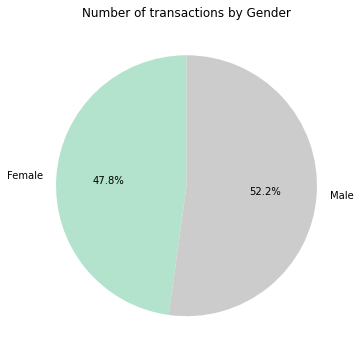

In [37]:
#Number of transactions by Gender
d=data.groupby(['gender'])['transaction_id'].count()
labels=['Female','Male']
ax=d.plot(kind='pie', figsize =(12,6), colormap='Pastel2',legend=False, autopct=lambda pct: func(pct, d),startangle = 90, labels=labels)
ax.set(xlabel="", ylabel="", title="Number of transactions by Gender")
plt.show()

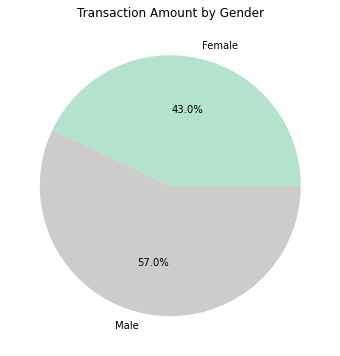

In [38]:
#Transaction amount by Gender
d=data.groupby(['gender'])['amount'].sum()
labels=['Female','Male']
ax=d.plot(kind='pie', figsize =(12,6), colormap='Pastel2',legend=False, autopct=lambda pct: func(pct, d), labels=labels)
ax.set(xlabel="", ylabel="", title="Transaction Amount by Gender")
plt.show()


In [39]:
data.drop_duplicates(subset=['account']).value_counts('gender')

gender
M    56
F    44
dtype: int64

### Insights 

Male customers have higher number and total amount of transactions than female customers, however the dataset has transaction details of 56 male customers against 44 female customers   

## Age

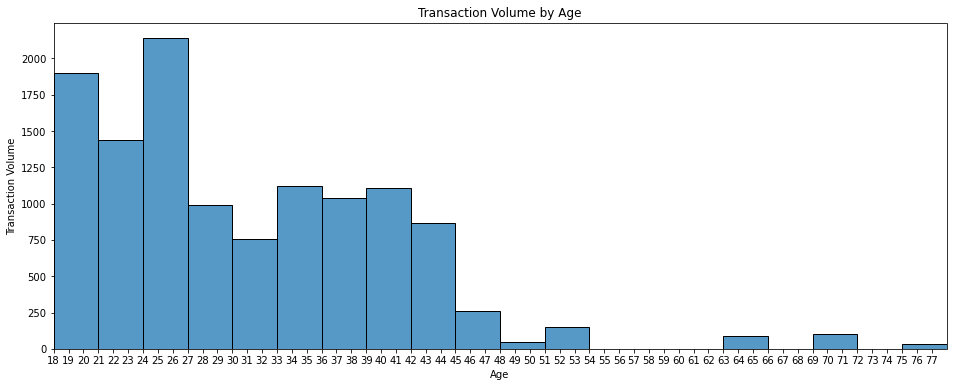

In [40]:
#Transaction volume by Age
plt.figure(figsize=(16, 6))
ax=sns.histplot(data=data.age, bins=20)

ax.set(xlabel="Age", ylabel="Transaction Volume", title="Transaction Volume by Age")
ax.set_xlim(18,78)
ax.set_xticks(range(18,78))
plt.show()

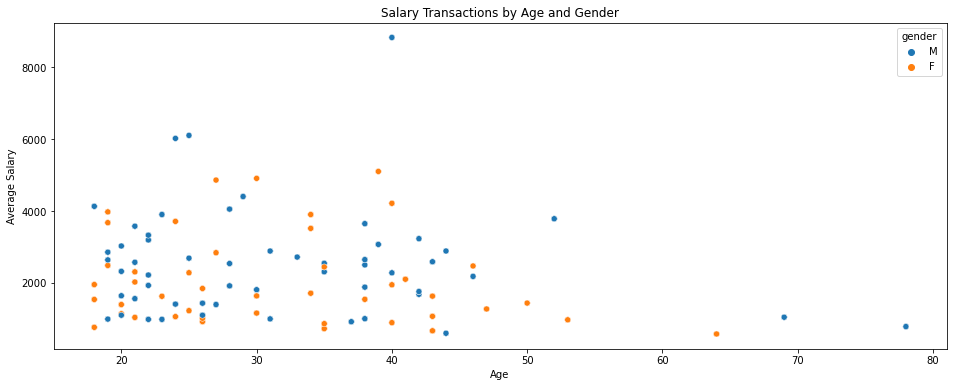

In [41]:
#Salary transactions by Age and Gender
plt.figure(figsize=(16, 6))
sns.scatterplot(data=data[data.movement=='credit'], x="age", hue="gender",color='cyan',y="amount")
plt.title("Salary Transactions by Age and Gender")
plt.xlabel("Age")
plt.ylabel("Average Salary")
plt.show()


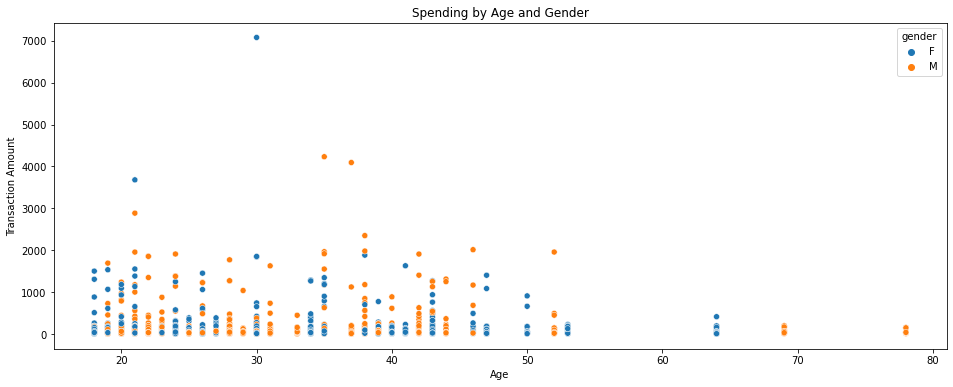

In [42]:
#Spending by Age and Gender
plt.figure(figsize=(16, 6))
sns.scatterplot(data=data[data.movement=='debit'], x="age", hue="gender", y="amount")
plt.title("Spending by Age and Gender")
plt.xlabel("Age")
plt.ylabel("Transaction Amount")
plt.show()

## Transaction Amount

In [43]:
df.amount.describe([0.25, 0.5, 0.75, 0.9])

count    12043.000000
mean       187.933588
std        592.599934
min          0.100000
25%         16.000000
50%         29.000000
75%         53.655000
90%        186.000000
max       8835.980000
Name: amount, dtype: float64

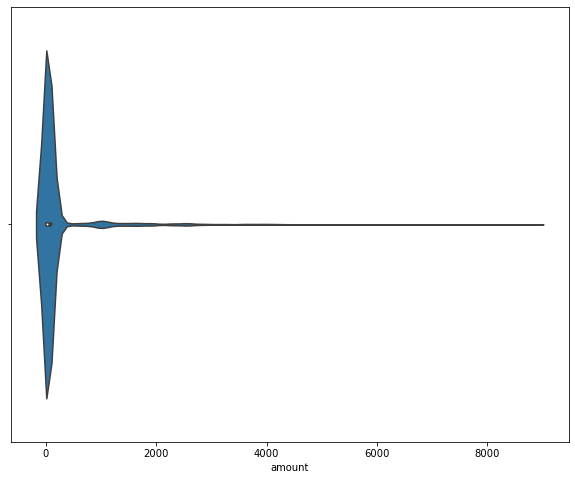

In [44]:
fig = plt.figure(figsize = (10,8))
sns.violinplot(data=data.amount, x=data.amount)
plt.show()

### Insights

• 90% of the transactions is below AUD 186.
• Minimum transaction is 0.1 AUD and maximum transaction 8835 AUD.


## Month/Day of Week/Hour

In [45]:
months=['Aug','Sep','Oct']
dow=['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
hr=range(0,24)

def display_stack(field1,field2,agg,agg_field,title,ticklabel):
    if(agg=='count'):
        ax=data.groupby([field1, field2])[agg_field].count().unstack().plot(kind='bar', stacked=True, figsize =(12,5), colormap='tab20c',rot=True)
    else:
        ax=data.groupby([field1, field2])[agg_field].sum().unstack().plot(kind='bar', stacked=True, figsize =(12,5), colormap='tab20c',rot=True)
        
    ax.set(xlabel="", ylabel="", title=title)
    ax.set_xticklabels(ticklabel)
    ax.legend(loc = 1, fontsize = 'small')
    plt.show()

In [46]:
#Number of transactions by month
data.groupby(['month'])['transaction_id'].count()

month
8     3942
9     4011
10    4083
Name: transaction_id, dtype: int64

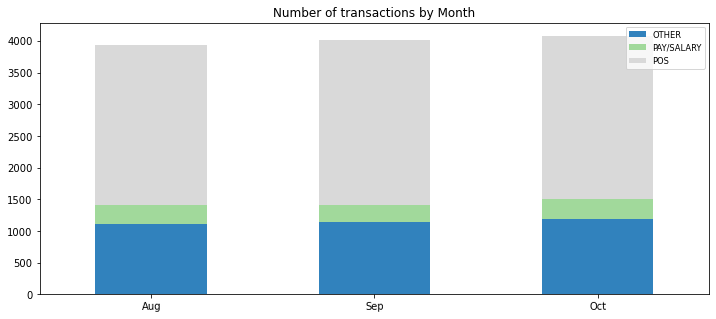

In [47]:
display_stack('month', 'txn_description','count','transaction_id','Number of transactions by Month',months)

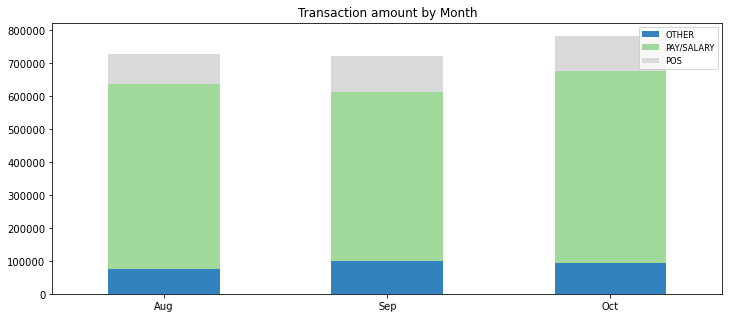

In [48]:
#Transaction amount by month
display_stack('month', 'txn_description','sum','amount','Transaction amount by Month',months)

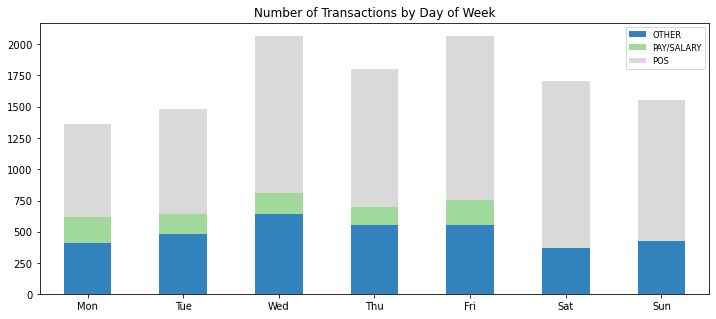

In [49]:
#Number of transactions by day of week
display_stack('day_of_week', 'txn_description','count','transaction_id','Number of Transactions by Day of Week',dow)

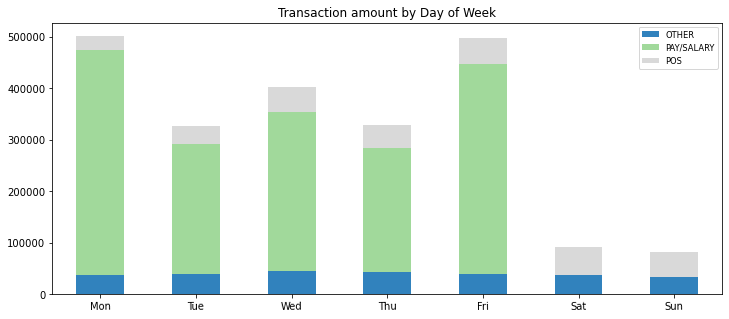

In [50]:
#Transaction amount by day of week
display_stack('day_of_week', 'txn_description','sum','amount','Transaction amount by Day of Week',dow)

In [51]:
data.groupby(['day_of_week','txn_description'])['amount'].sum()

day_of_week  txn_description
0            OTHER               38125.00
             PAY/SALARY         437064.14
             POS                 27287.91
1            OTHER               39415.00
             PAY/SALARY         252743.33
             POS                 34825.86
2            OTHER               45502.00
             PAY/SALARY         307770.28
             POS                 49457.44
3            OTHER               43118.00
             PAY/SALARY         241225.41
             POS                 44559.36
4            OTHER               39359.00
             PAY/SALARY         408203.74
             POS                 49880.66
5            OTHER               36992.00
             POS                 56010.56
6            OTHER               34330.00
             POS                 47844.56
Name: amount, dtype: float64

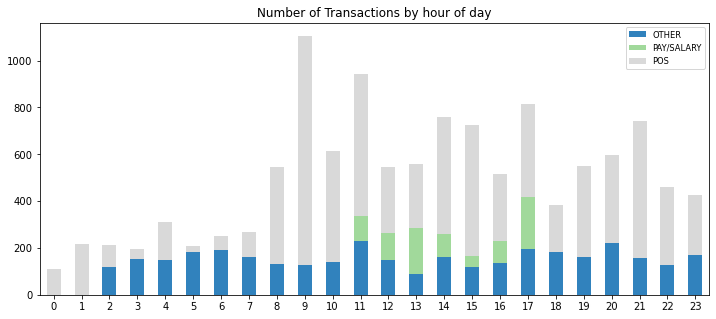

In [52]:
#Number of transactions by hour of day
display_stack('hour', 'txn_description','count','transaction_id','Number of Transactions by hour of day',hr)

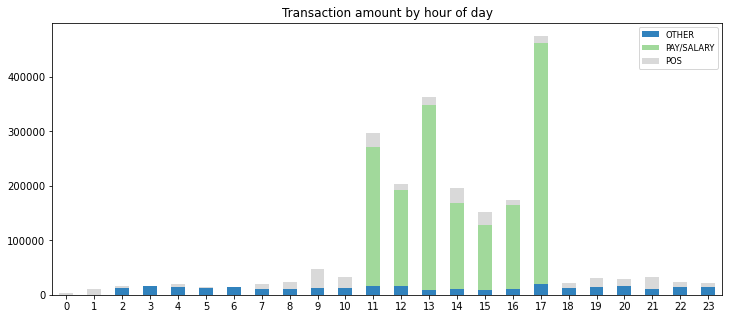

In [53]:
#Transaction amount by hour of day
display_stack('hour', 'txn_description','mean','amount','Transaction amount by hour of day',hr)

### Insights  

• October has slightly higher number and value of transactions compared to August and September 
• Wednesday and Friday account for highest number of transactions.
• POS transactions highest on Saturday followed by Friday and Wednesday 
• Monday had the least number of transactions but the highest total transaction amount due to salary credits
• Total transaction amount is the least on Sunday.


## Location 

In [54]:
data.loc[:,'merchant_longitude']=  data.merchant_long_lat.str.split(expand = True).iloc[:,0]
data.loc[:,'merchant_latitude']=data.merchant_long_lat.str.split(expand = True).iloc[:,1]

C:\Users\Simi\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
C:\Users\Simi\anaconda3\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [55]:
data.loc[:,'customer_longitude']=  data.long_lat.str.split(expand = True).iloc[:,0]
data.loc[:,'customer_latitude']=data.long_lat.str.split(expand = True).iloc[:,1]

In [56]:
map_data=data[-(data.merchant_long_lat=='n/a')]
map_data.shape

(7717, 26)

In [57]:
map_data=map_data.astype({'merchant_longitude':float, 'merchant_latitude':float})
map_data=map_data.astype({'customer_longitude':float, 'customer_latitude':float})
map_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7717 entries, 0 to 12042
Data columns (total 26 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   status              7717 non-null   object        
 1   card_present_flag   7717 non-null   object        
 2   account             7717 non-null   object        
 3   long_lat            7717 non-null   object        
 4   txn_description     7717 non-null   object        
 5   merchant_id         7717 non-null   object        
 6   first_name          7717 non-null   object        
 7   balance             7717 non-null   float64       
 8   date                7717 non-null   datetime64[ns]
 9   gender              7717 non-null   object        
 10  age                 7717 non-null   int64         
 11  merchant_suburb     7717 non-null   object        
 12  merchant_state      7717 non-null   object        
 13  extraction          7717 non-null   object     

In [58]:
map_data=map_data[(map_data.merchant_longitude>=-180) & (map_data.merchant_longitude<=180) & (map_data.merchant_latitude>=-90) & (map_data.merchant_latitude<=90) ]
map_data.describe()

,balance,age,amount,month,day_of_week,hour,merchant_longitude,merchant_latitude,customer_longitude,customer_latitude
count,7717.000000,7717.000000,7717.000000,7717.000000,7717.000000,7717.000000,7717.000000,7717.000000,7717.000000,7717.000000
mean,11871.056585,30.052093,40.153732,9.005961,3.286381,13.412207,143.433277,-32.752651,143.779001,-37.682413
std,25999.398243,9.439454,149.833070,0.814250,1.886458,5.769436,12.090074,5.282423,16.901687,54.745625
min,0.240000,18.000000,0.100000,8.000000,0.000000,0.000000,113.830000,-43.310000,114.620000,-573.000000
25%,2723.890000,23.000000,12.080000,8.000000,2.000000,9.000000,144.680000,-37.710000,138.670000,-37.580000
50%,5286.040000,27.000000,19.700000,9.000000,3.000000,14.000000,145.830000,-33.840000,145.730000,-33.780000
75%,10278.290000,38.000000,33.910000,10.000000,5.000000,19.000000,151.210000,-29.440000,151.230000,-27.950000
max,267093.660000,78.000000,7081.090000,10.000000,6.000000,23.000000,153.610000,-12.330000,255.000000,-12.370000


In [59]:
import folium
latitude=-27.00
longitude=133.00
map=folium.Map(location=[latitude,longitude], zoom_start=5)

In [60]:
t=folium.map.FeatureGroup()
for lat,long in zip(map_data.customer_latitude, map_data.customer_longitude):
    t.add_child(
    folium.Circle([lat,long])
    )
map=folium.Map(location=[latitude,longitude],zoom_start=4)
map.add_child(t)

In [61]:
t=folium.map.FeatureGroup()
for lat,long in zip(map_data.merchant_latitude, map_data.merchant_longitude):
    t.add_child(
    folium.Circle([lat,long])
    )
map=folium.Map(location=[latitude,longitude],zoom_start=4)
map.add_child(t)


In [62]:
data.merchant_state.value_counts()

n/a    4319
NSW    2169
VIC    2131
QLD    1556
WA     1100
SA      415
NT      205
ACT      73
TAS      68
Name: merchant_state, dtype: int64

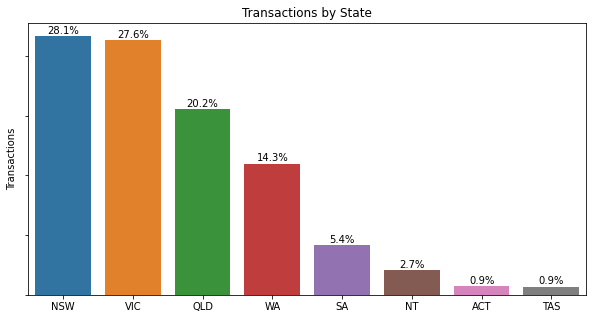

In [63]:
#Number of transactions by State
plt.figure(figsize=(10,5))
ax=sns.countplot(x='merchant_state',data=data[-(data.merchant_state=='n/a')], order = data[-(data.merchant_state=='n/a')].merchant_state.value_counts(ascending = False).index)
ax.set(xlabel="", ylabel="Transactions", title="Transactions by State")
total = len(data[-(data.merchant_state=='n/a')])
ax.set_yticklabels("")
display_percent(ax)
plt.show()

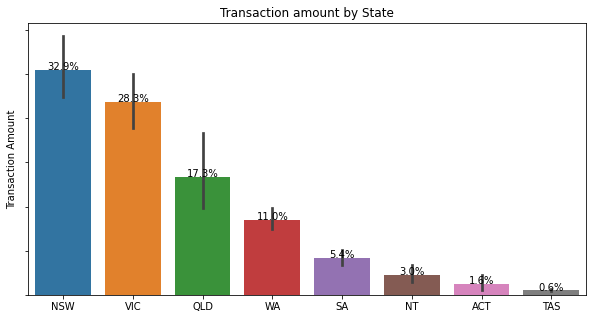

In [64]:
#Average purchase transactions by State
plt.figure(figsize=(10,5))
ax=sns.barplot(x='merchant_state',y='amount',data=data[-(data.merchant_state=='n/a')], order = data[-(data.merchant_state=='n/a')].merchant_state.value_counts(ascending = False).index,estimator=sum)
ax.set(xlabel="", ylabel="Transaction Amount", title="Transaction amount by State")
total = data[-(data.merchant_state=='n/a')].amount.sum()
ax.set_yticklabels("")
display_percent(ax)
plt.show()

In [65]:
data.drop_duplicates(subset=['account']).value_counts('merchant_state')

merchant_state
n/a    43
VIC    19
NSW    15
QLD    10
WA      7
SA      4
NT      2
dtype: int64

### Insights

• Customer locations are primarily concentrated around major cities, however merchant locations are more widely distributed
• Most of the transactions are in New South Wales and Victoria. While the number of transactions are similar in both states,
  the amount of transaction is higher for merchants in NSW. Dataset contains more VIC and NSW accounts compared to other states


In [67]:
data.to_excel (r'Data_PA.xlsx', index = False, header=True)